# Loading Libraries

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline


In [68]:
from fastai.vision import *
from fastai.callbacks.hooks import *
from fastai.metrics import dice
from fastai.vision.interpret import SegmentationInterpretation
import numpy as np
import shutil
import glob
import pandas as pd
torch.cuda.set_device(1)

# Defining training path and exploring data

There were initially 1100+ images in training/input folder but only 804 segmented images were present in training/output folder. So the images for which segmented output was not there were deleted.

In [48]:
path = 'training/'

In [50]:
path_lbl = path+'output'
path_img = path+'input'

In [51]:
path_img

'training/input'

In [52]:
fnames = get_image_files(path_img)
fnames[:3]

[PosixPath('training/input/img-1026.png'),
 PosixPath('training/input/img-60.png'),
 PosixPath('training/input/img-202.png')]

In [7]:
lbl_names = get_image_files(path_lbl)
lbl_names[:3]

[PosixPath('training/output/img-1026.png'),
 PosixPath('training/output/img-60.png'),
 PosixPath('training/output/img-202.png')]

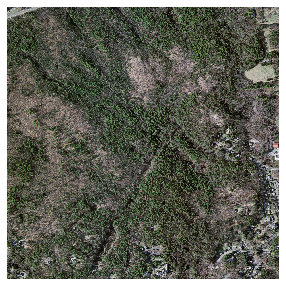

In [8]:
img_f = fnames[0]
img = open_image(img_f)
img.show(figsize=(5,5))

## Writing function to extract segmentation labels files

In [9]:
get_y_fn = lambda x: path_lbl+f'/{x.stem}{x.suffix}'

In [10]:
get_y_fn(lbl_names[0])

'training/output/img-1026.png'

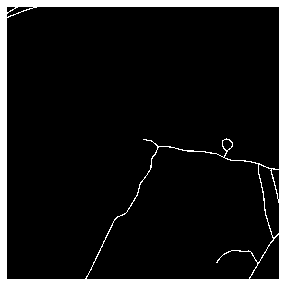

In [11]:
img = open_image(lbl_names[0])
img.show(figsize=(5,5))

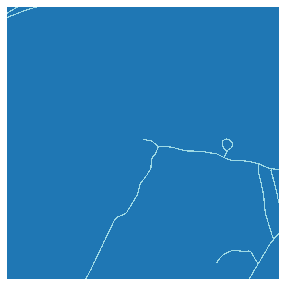

In [12]:
mask = open_mask(lbl_names[0])
mask.show(figsize=(5,5), alpha=1)

In [13]:
src_size = np.array(mask.shape[1:])
src_size,mask.data

(array([1500, 1500]), tensor([[[0, 0, 0,  ..., 0, 0, 0],
          [0, 0, 0,  ..., 0, 0, 0],
          [0, 0, 0,  ..., 0, 0, 0],
          ...,
          [0, 0, 0,  ..., 0, 0, 0],
          [0, 0, 0,  ..., 0, 0, 0],
          [0, 0, 0,  ..., 0, 0, 0]]]))

#### Defining classes as 0-background & 1- road

In [14]:
codes = array([0,1])

#### As image size is 1500x1500, its too large to fit into gpu, so reducing image size into half. To  fit into memory, only batch size of 1 is used.

In [15]:
size = src_size//2
bs=1

# Data Preparation

## Creating a segmentation databunch to train

As the segmentation label images were ranging 0 to 255, div was used so that its in the range of 0 to 1. For creating validation data 10% of data was randomly used. Databunch is normalized by imagenet stats.

In [16]:
class SegLabelListCustom(SegmentationLabelList):
    def open(self, fn): return open_mask(fn, div=True)
    
class SegItemListCustom(ImageList):
    _label_cls = SegLabelListCustom

src = (SegItemListCustom.from_folder(path_img)
       .split_by_rand_pct(valid_pct=0.1,seed=123)
       .label_from_func(get_y_fn, classes=codes))

In [17]:
data = (src.transform(get_transforms(), size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats))

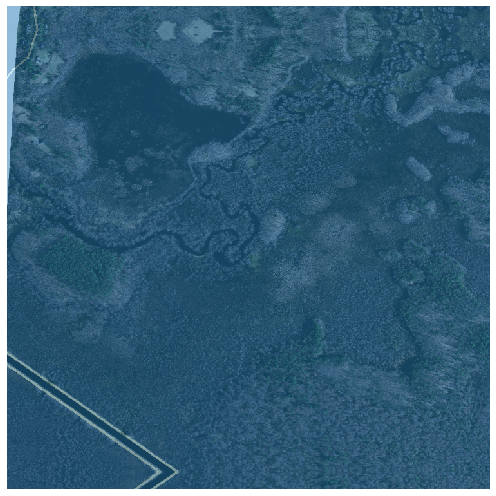

In [18]:
data.show_batch(2, figsize=(10,7))

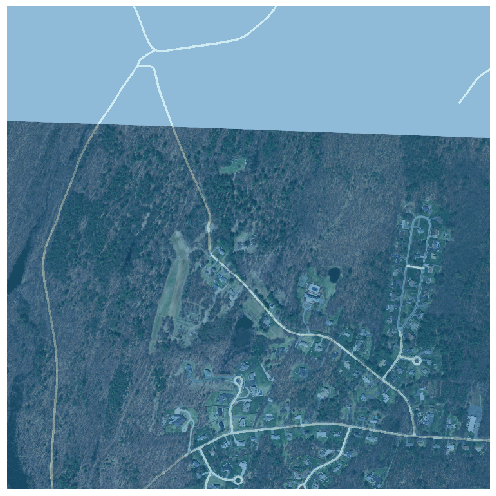

In [19]:
data.show_batch(2, figsize=(10,7), ds_type=DatasetType.Valid)

# Defining metrics to be used

Pixel accuracy and iou functions are defined so that those metrics can be calculated for the model.

In [20]:
def acc(input_img, target):
    target = target.squeeze(1)
    
    return (input_img.argmax(dim=1)==target).float().mean()

In [21]:
def iou(input_img, target):
    return dice(input_img, target, iou=True)

In [22]:
wd=1e-2

# Model Training

## Model Definition

<b> U-Net</b> is used as the segmentation architecture for training this data with <b>ResNet50 backbone</b>. U-Net is a Fully Convolutional Network (FCN) that does image segmentation. Its goal is then to predict each pixel’s class. 

<img src="unet.jpg" style="width: 1000px;">

U-Net architecture is separated in 3 parts:

1 : The contracting/downsampling path
2 : Bottleneck
3 : The expanding/upsampling path

U-net is symmetric and  the skip connections between the downsampling path and the upsampling path apply a concatenation operator instead of a sum. These skip connections intend to provide local information to the global information while upsampling. Because of its symmetry, the network has a large number of feature maps in the upsampling path, which allows to transfer information effectively.



In [23]:
learn = unet_learner(data, models.resnet50, metrics=acc, wd=wd)

In [24]:
learn

Learner(data=ImageDataBunch;

Train: LabelList (724 items)
x: SegItemListCustom
Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750)
y: SegLabelListCustom
ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750)
Path: training/input;

Valid: LabelList (80 items)
x: SegItemListCustom
Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750)
y: SegLabelListCustom
ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750)
Path: training/input;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
      (3): MaxPool2d(kernel_siz

## Superconvergence

<b>Super convergence</b> is a method in which  we try to train neural networks with large learning rate to a better solution in so much fewer total iteration than traditional learning with low learning rates. One of the key elements of super-convergence is training with one cycle Policy and a large  learning rate finder.

<b>Learning Rate Range Finder</b>

Learning rate is one of the most important hyper parameters when it comes to training a neural network. It scales the magnitude of our weight updates in order to minimize the network's loss function.
A systematic approach in finding such learning rate is by observing the magnitudes of loss change with different learning rates. First, we need to gradually increase the learning rate either linearly or exponentially and after each mini batch, record the loss at each increment as shown below. <b>The learning rate should be set within the range where the occurrence of loss decreases drastically.</b>
<img src='LR Range.png'>


<b> Learning Rate Range Finder along with 1-cycle policy helps in achieving superconvergence.</b>

epoch,train_loss,valid_loss,acc,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


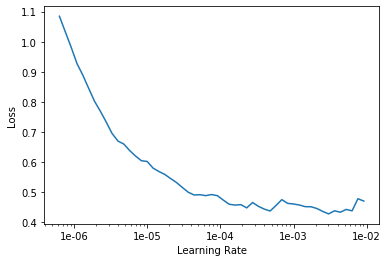

In [22]:
learn.lr_find()
learn.recorder.plot()

In [23]:
from fastai.callbacks import *

## Training

Model is trained with the max learning rate found in previous step i.e. 1e-03. Results are saved so that it can loaded later.

In [ ]:
learn.fit_one_cycle(5,max_lr=1e-03,callbacks=[SaveModelCallback(learn, every='epoch', monitor='accuracy', name='unet_resnet50-seg-first'),CSVLogger(learn,filename='unet_resnet50-seg-first',append=True)])

epoch,train_loss,valid_loss,acc,time
0,0.171635,0.141595,0.955828,11:34
1,0.100101,0.108214,0.964034,11:27
2,0.083524,0.095749,0.966611,11:26


In [29]:

learn.unfreeze()
learn.fit_one_cycle(10, max_lr=slice(1e-5,1e-3),callbacks=[SaveModelCallback(learn,  monitor='acc',mode='max', name='unet_resnet50-seg-full'),CSVLogger(learn,filename='unet_resnet50-seg-full',append=True)])

epoch,train_loss,valid_loss,acc,time
0,0.086278,0.091040,0.968728,11:38
1,0.088150,0.100476,0.966763,11:37
2,0.100487,0.091979,0.968536,11:37
3,0.086654,0.089383,0.969316,11:37
4,0.088751,0.098102,0.967694,11:37


Better model found at epoch 0 with acc value: 0.9687281847000122.
Better model found at epoch 3 with acc value: 0.9693158268928528.


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [70]:
df = pd.read_csv('training/input/unet_resnet50-seg-full.csv')
df.iloc[2:]

,epoch,train_loss,valid_loss,acc,time
2,0,0.086278,0.091040,0.968728,11:42
3,1,0.088150,0.100476,0.966763,11:37
4,2,0.100487,0.091979,0.968536,11:37
5,3,0.086654,0.089383,0.969316,11:45
6,4,0.088751,0.098102,0.967694,11:37
7,5,0.086969,0.092659,0.969262,11:37
8,6,0.077214,0.083111,0.971133,11:45
9,7,0.083246,0.083709,0.971635,11:45
10,8,0.068765,0.084334,0.971684,11:45
11,9,0.076051,0.084881,0.971693,11:45


# Plotting of  training and validation losses

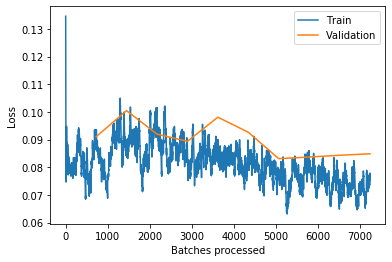

In [30]:
learn.recorder.plot_losses()

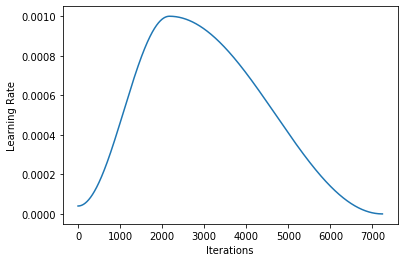

In [31]:
learn.recorder.plot_lr()

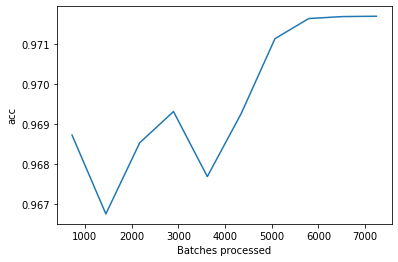

In [32]:
learn.recorder.plot_metrics()

In [25]:
learn.load('unet_resnet50-seg-full')

Learner(data=ImageDataBunch;

Train: LabelList (724 items)
x: SegItemListCustom
Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750)
y: SegLabelListCustom
ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750)
Path: training/input;

Valid: LabelList (80 items)
x: SegItemListCustom
Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750)
y: SegLabelListCustom
ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750)
Path: training/input;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
      (3): MaxPool2d(kernel_siz

# Calculation of metrics

<b>3 metrics are calculated namely pixel accuracy,IOU and dice coefficent. Pixel accuracy is 0.9717, IOU is 0.5433 and dice coeff is 0.6914.</b> 

In [26]:
learn.validate(metrics= [acc,iou,dice])

[0.084880814, tensor(0.9717), tensor(0.5433), tensor(0.6914)]

In [27]:
interp = SegmentationInterpretation.from_learner(learn,ds_type=DatasetType.Valid)

In [28]:
mean_cm, single_img_cm = interp._generate_confusion()

label,score
0.0,0.990448
1.0,0.635308


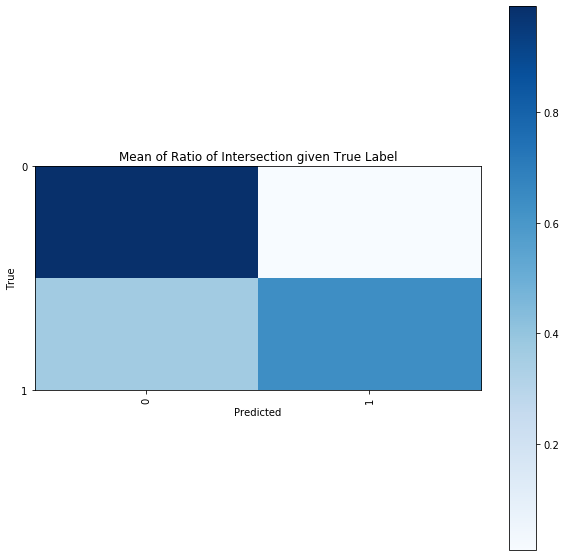

In [29]:
df = interp._plot_intersect_cm(mean_cm, "Mean of Ratio of Intersection given True Label")

In [30]:
mean_cm

array([[0.990448, 0.009552],
       [0.364692, 0.635308]], dtype=float32)

# Plotting a sample of  Validation Results

In [31]:
def plot_results(interp,num_images=5,figure_size=(20,20),data_type='valid'):
    image_set = np.random.choice(range(len(interp.pred_class)),num_images,replace=False)
    for row in image_set:

        print('\033[1m' +'original_image/groundtruth_segementation/predicted_segmentation')
        fig,axes = plt.subplots(1,3,figsize=figure_size,squeeze=False)
        org_image = interp.data.valid_ds[row][0]
        grd_seg = ImageSegment(interp.y_true[row])
        pred_seg = ImageSegment(interp.pred_class[row][None,:])
        org_image.show(axes[0,0])
        grd_seg.show(axes[0,1])
        pred_seg.show(axes[0,2])


        plt.pause(0.1)
        #plt.tight_layout()
        plt.show()
   

original_image/groundtruth_segementation/predicted_segmentation


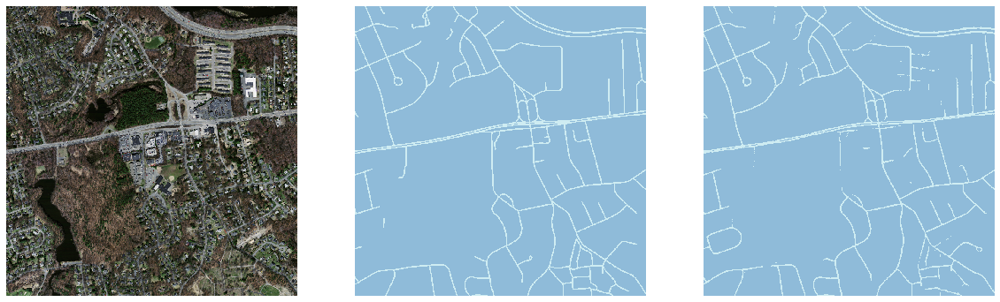

original_image/groundtruth_segementation/predicted_segmentation


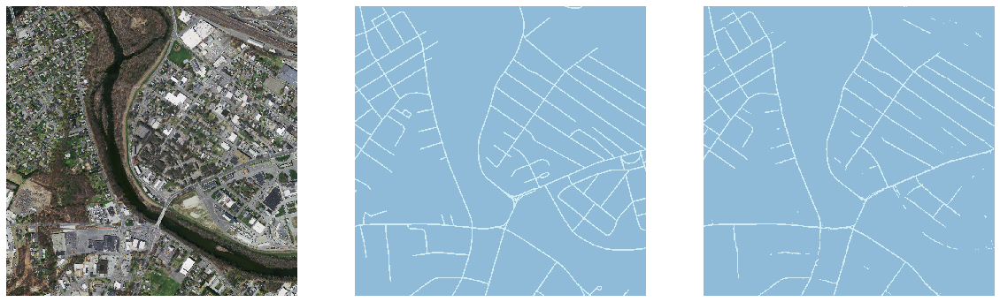

original_image/groundtruth_segementation/predicted_segmentation


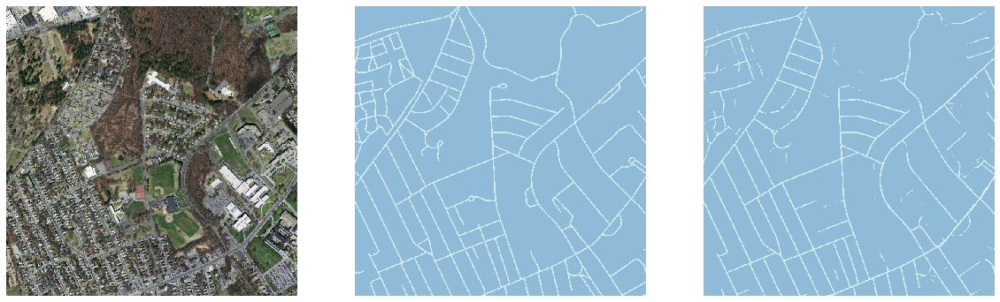

original_image/groundtruth_segementation/predicted_segmentation


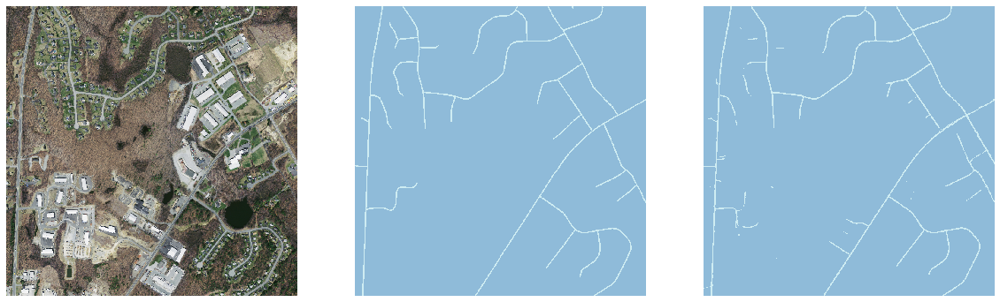

original_image/groundtruth_segementation/predicted_segmentation


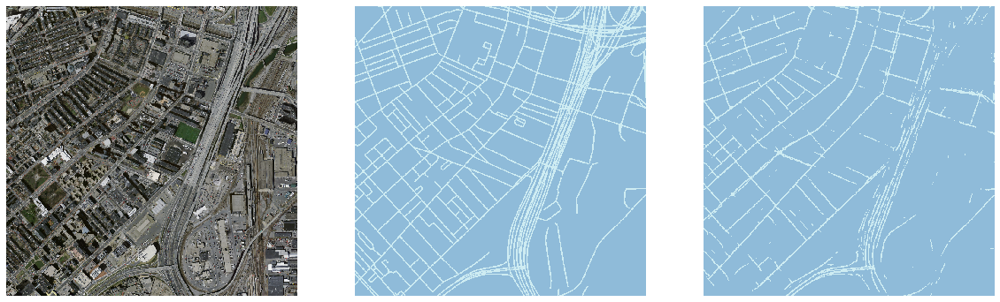

In [32]:
plot_results(interp)

# Now running for test set

In [ ]:
path_lbl = path+'output'
path_img = path+'input'

In [55]:
path_img = 'training/input'
path_lbl = 'training/output'

In [56]:
path_img_test = 'testing/input'
path_lbl_test = 'testing/output'

In [57]:
get_y_fn = lambda x: path_lbl+f'/{x.stem}{x.suffix}'
get_y_fn1 = lambda x: path_lbl_test+f'/{x.stem}{x.suffix}'

In [58]:
class SegLabelListCustom(SegmentationLabelList):
    def open(self, fn): return open_mask(fn, div=True)
    
class SegItemListCustom(ImageList):
    _label_cls = SegLabelListCustom

src = (SegItemListCustom.from_folder(path_img)
       .split_none()
       .label_from_func(get_y_fn, classes=codes))
src_test = (SegItemListCustom.from_folder(path_img_test)
       .split_none()
       .label_from_func(get_y_fn1, classes=codes))
src.valid = src_test.train

In [59]:
data = (src.transform(get_transforms(), size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats))

In [61]:
learn = unet_learner(data, models.resnet50, metrics=acc, wd=wd)

In [62]:
learn.load('unet_resnet50-seg-full')

Learner(data=ImageDataBunch;

Train: LabelList (804 items)
x: SegItemListCustom
Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750)
y: SegLabelListCustom
ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750)
Path: training/input;

Valid: LabelList (13 items)
x: SegItemListCustom
Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750),Image (3, 750, 750)
y: SegLabelListCustom
ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750),ImageSegment (1, 750, 750)
Path: testing/input;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
      (3): MaxPool2d(kernel_size

# Calculation of metrics for test set

<b>Pixel accuracy of test set is 0.963, IOU is 0.5551 and dice coeff is 0.7104.

In [63]:
learn.validate(metrics= [acc,iou,dice])

[0.09952111, tensor(0.9639), tensor(0.5551), tensor(0.7104)]

In [64]:
interp = SegmentationInterpretation.from_learner(learn,ds_type=DatasetType.Valid)

# Plotting of Test Set results

The plot is scrollable and all the 13 test set results can be seen.

original_image/groundtruth_segementation/predicted_segmentation


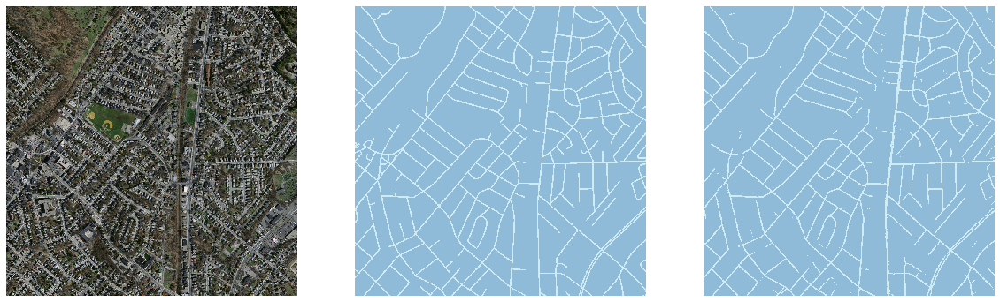

original_image/groundtruth_segementation/predicted_segmentation


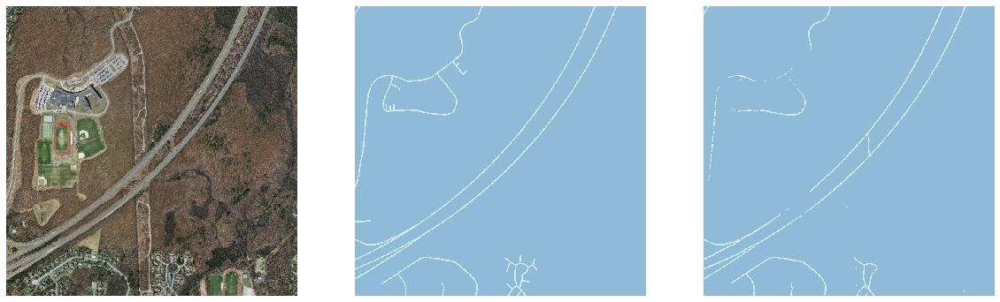

original_image/groundtruth_segementation/predicted_segmentation


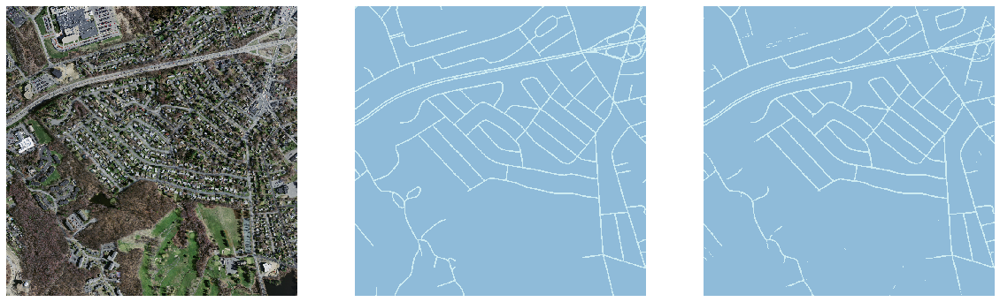

original_image/groundtruth_segementation/predicted_segmentation


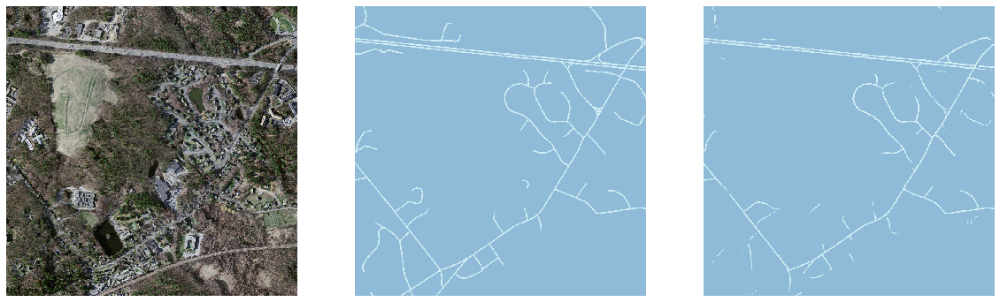

original_image/groundtruth_segementation/predicted_segmentation


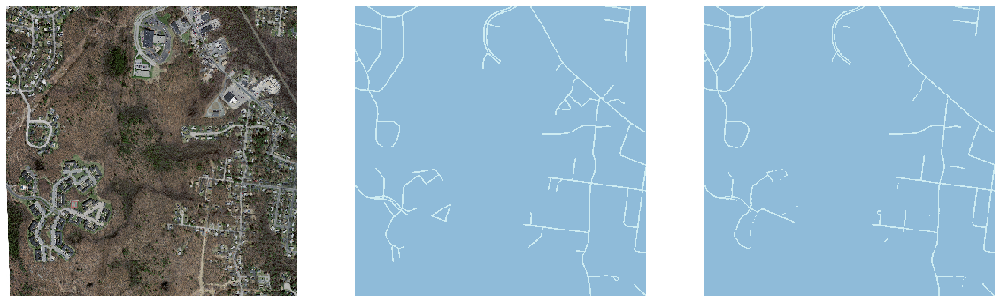

original_image/groundtruth_segementation/predicted_segmentation


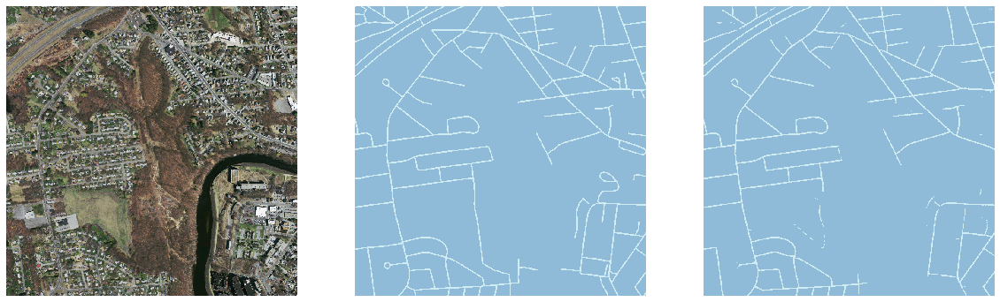

original_image/groundtruth_segementation/predicted_segmentation


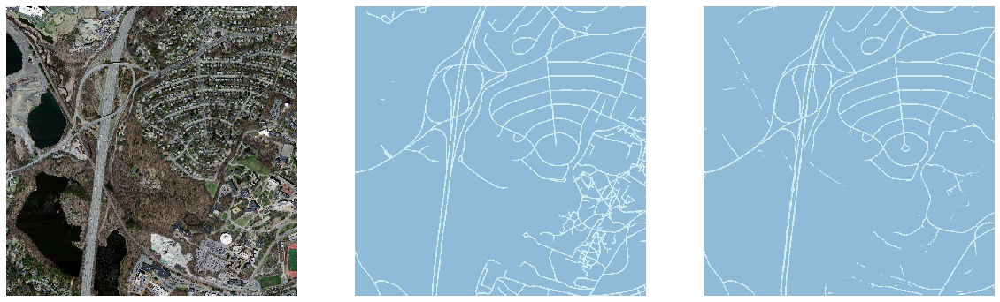

original_image/groundtruth_segementation/predicted_segmentation


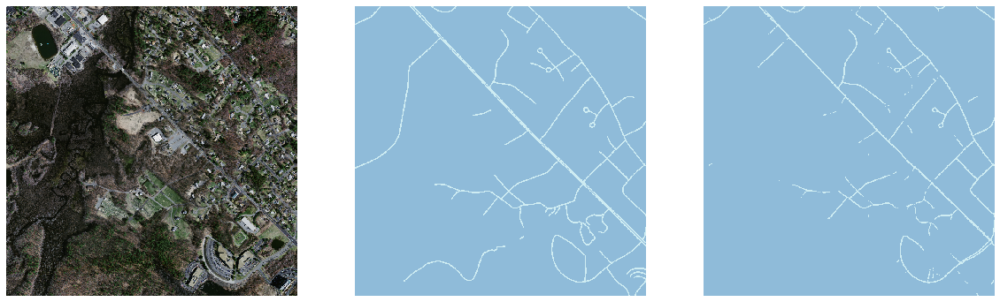

original_image/groundtruth_segementation/predicted_segmentation


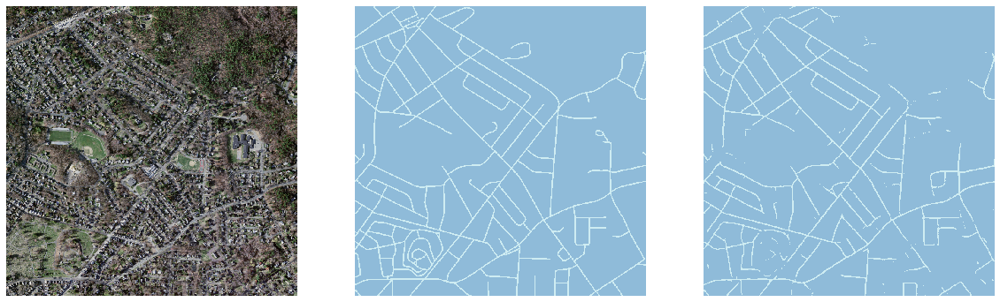

original_image/groundtruth_segementation/predicted_segmentation


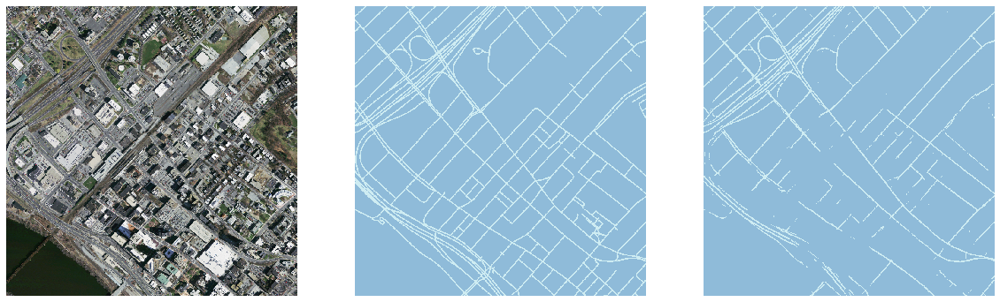

original_image/groundtruth_segementation/predicted_segmentation


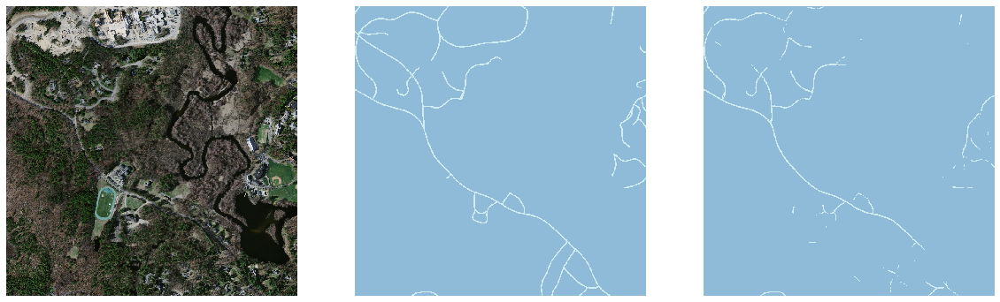

original_image/groundtruth_segementation/predicted_segmentation


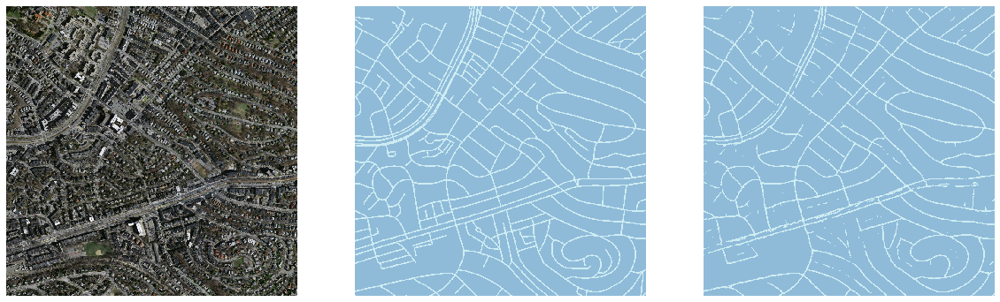

original_image/groundtruth_segementation/predicted_segmentation


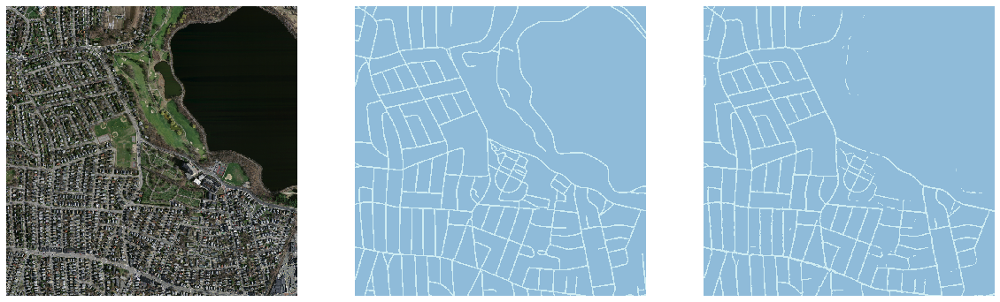

In [65]:
plot_results(interp,13)

# Resizing the segmented image to original size

In [ ]:
import cv2 as cv
gt_img_big = cv.resize(segmented_img, (1500, 1500),
                        interpolation=cv.INTER_NEAREST)  